# PoC Without Spike-in

## Introduction

The following script imports the total and newly synthesized data as output by the silac_dia_tools pipeline and uses the alphapeptstats package to perfrom exploratory data analysis.  This analysis focuses on the samples that contain no spike-in and were normalized using the channel staking method followed by directLFQ for normalization.

In [2]:
# Import packages
import alphastats 
import pandas as pd
import matplotlib.pyplot as plt

In [3]:
#have an error loading in the csv files 

In [4]:
# Set path to protein intensities and set up loader for nsp and total dfs
path = "G:/My Drive/Data/data/no spikein data/protein intensities/"
# intitialize loader object for total intensity
loader_total = alphastats.GenericLoader(f"{path}total_dlfq.csv", 
                                  intensity_column = '[Sample]',
                                   index_column="Protein.Group")

# Initialize object for nsp intensity
loader_nsp = alphastats.GenericLoader(f"{path}nsp_dlfq.csv", 
                                  intensity_column = '[Sample]',
                                   index_column="Protein.Group")

In [5]:
# Initialize dataset objects for total and nsp dfs
df_total = alphastats.DataSet(
    loader = loader_total,
    metadata_path = f"G:/My Drive/Data/data/no spikein data/meta.csv",
    sample_column = 'Run')

DataSet has been created.
Attributes of the DataSet can be accessed using: 
DataSet.rawinput:	 Raw Protein data.
DataSet.mat:		Processed data matrix with ProteinIDs/ProteinGroups as columns and samples as rows. All computations are performed on this matrix.
DataSet.metadata:	Metadata for the samples in the matrix. Metadata will be matched with DataSet.mat when needed (for instance Volcano Plot).


In [6]:
df_nsp = alphastats.DataSet(
    loader = loader_nsp,
    metadata_path = f"G:/My Drive/Data/data/no spikein data/meta.csv",
    sample_column = 'Run')

DataSet has been created.
Attributes of the DataSet can be accessed using: 
DataSet.rawinput:	 Raw Protein data.
DataSet.mat:		Processed data matrix with ProteinIDs/ProteinGroups as columns and samples as rows. All computations are performed on this matrix.
DataSet.metadata:	Metadata for the samples in the matrix. Metadata will be matched with DataSet.mat when needed (for instance Volcano Plot).


In [7]:
# Look at metadata (same for both datasets)
df_total.metadata

,Run,Sample,Treatment
0,Janice_20231005_AJW_HSdia_px07_FAC_1,FAC_1,FAC
1,Janice_20231005_AJW_HSdia_px07_FAC_2,FAC_2,FAC
2,Janice_20231005_AJW_HSdia_px07_FAC_3,FAC_3,FAC
3,Janice_20231005_AJW_HSdia_px07_Gu3340_1,Gu3340_1,Gu3340
4,Janice_20231005_AJW_HSdia_px07_Gu3340_2,Gu3340_2,Gu3340
5,Janice_20231005_AJW_HSdia_px07_Gu3340_3,Gu3340_3,Gu3340
6,Janice_20231005_AJW_HSdia_px07_both_1,both_1,both
7,Janice_20231005_AJW_HSdia_px07_both_2,both_2,both
8,Janice_20231005_AJW_HSdia_px07_both_3,both_3,both
9,Janice_20231005_AJW_HSdia_px07_control_1,control_1,control


In [8]:
df_total.overview()

Attributes of the DataSet can be accessed using: 
DataSet.rawinput:	 Raw Protein data.
DataSet.mat:		Processed data matrix with ProteinIDs/ProteinGroups as columns and samples as rows. All computations are performed on this matrix.
DataSet.metadata:	Metadata for the samples in the matrix. Metadata will be matched with DataSet.mat when needed (for instance Volcano Plot).


In [9]:
# Log2 transform data and subset based on metadata
df_total.preprocess(subset=True)

Data has been log2-transformed.


In [10]:
df_nsp.preprocess(subset=True)

Data has been log2-transformed.


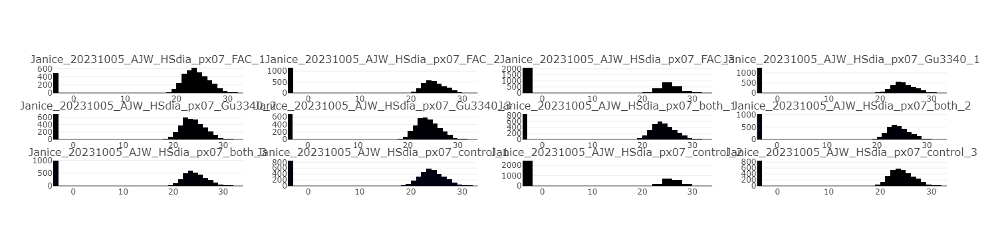

In [11]:
df_total.plot_samplehistograms()

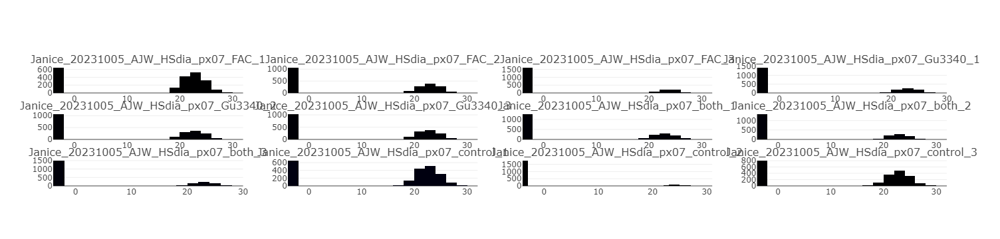

In [12]:
df_nsp.plot_samplehistograms() # many 0 values in the df need to be removed

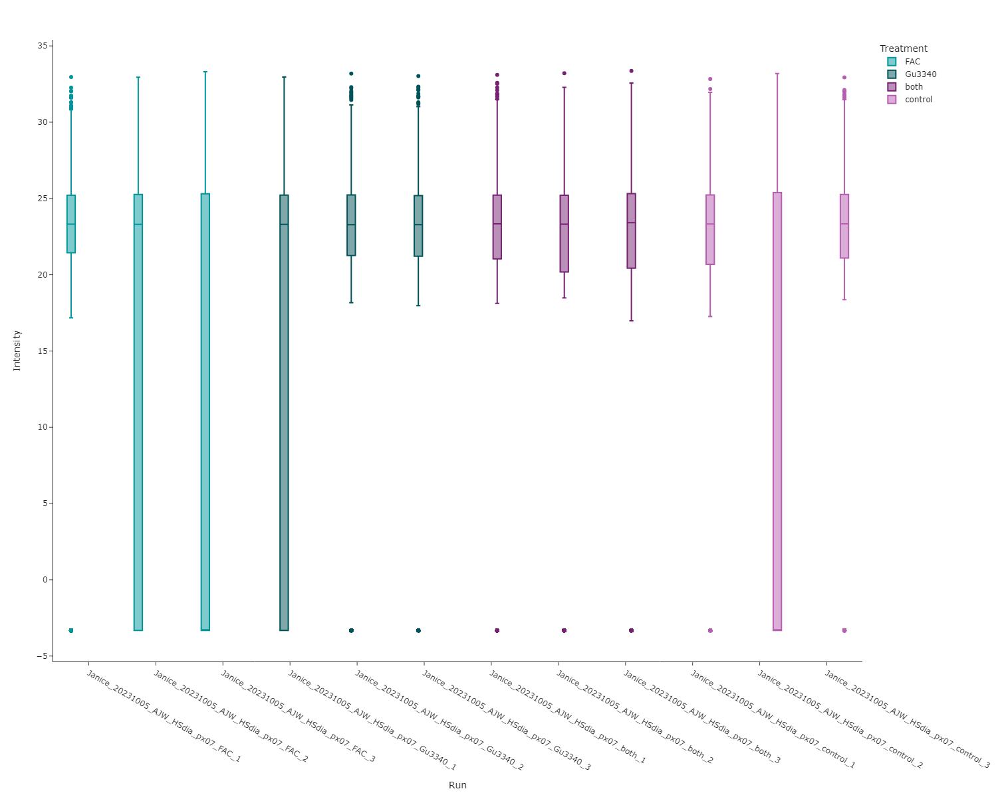

In [13]:
# Distribution plot of total intensity
distribution_plot = df_total.plot_sampledistribution(color='Treatment', method="box")
distribution_plot.update_layout(plot_bgcolor="white", paper_bgcolor="white", height=1200)

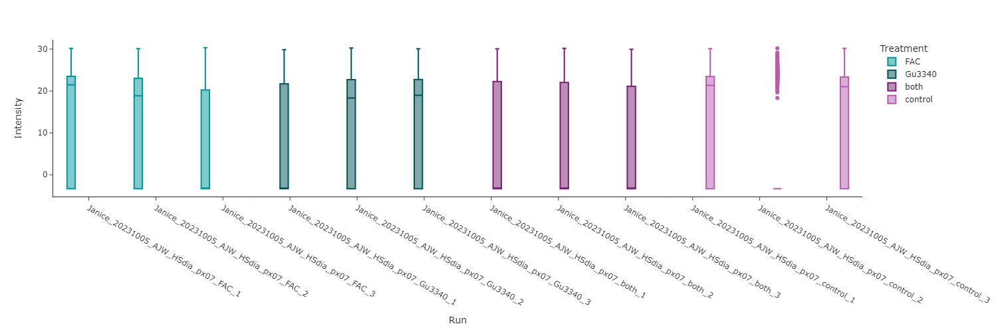

In [14]:
# Distribution plot of nsp intensity
distribution_plot = df_nsp.plot_sampledistribution(color='Treatment', method="box")
distribution_plot.update_layout(plot_bgcolor="white", paper_bgcolor="white", height=500)

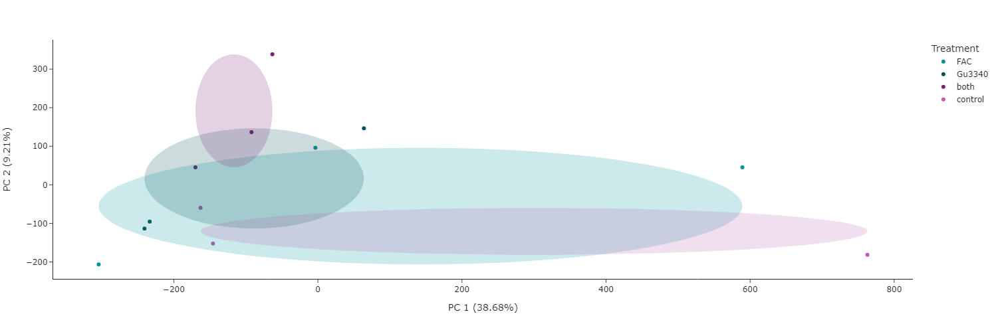

In [17]:
# PCA of total df
pca = df_total.plot_pca(group='Treatment', circle=True)  #.update_layout(plot_bgcolor="white", paper_bgcolor="white")
pca.update_layout(plot_bgcolor="white", paper_bgcolor="white", height=500)

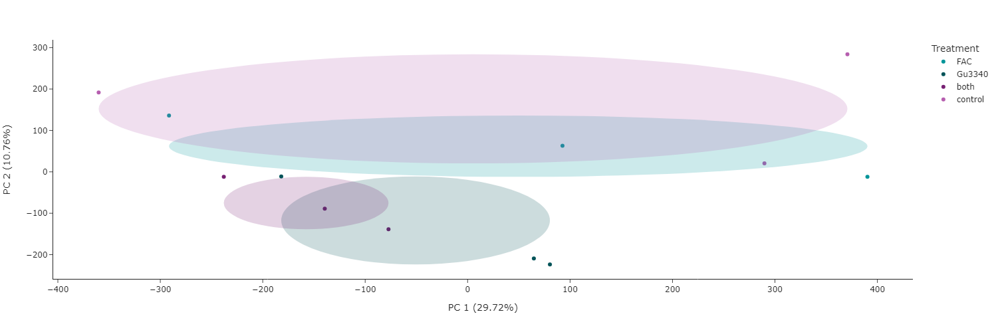

In [18]:
# PCA of nsp df
pca = df_nsp.plot_pca(group='Treatment', circle=True)  #.update_layout(plot_bgcolor="white", paper_bgcolor="white")
pca.update_layout(plot_bgcolor="white", paper_bgcolor="white", height=500)

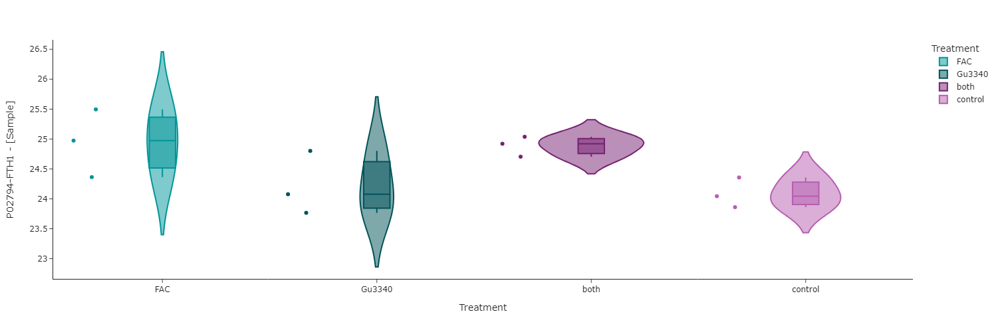

In [19]:
plot = df_nsp.plot_intensity(
    method="all",
    protein_id="P02794-FTH1", 
    group="Treatment", # column in metadata
    add_significance=True # add bar with pvalue
    )
plot.update_layout(plot_bgcolor="white", paper_bgcolor="white", height=500)

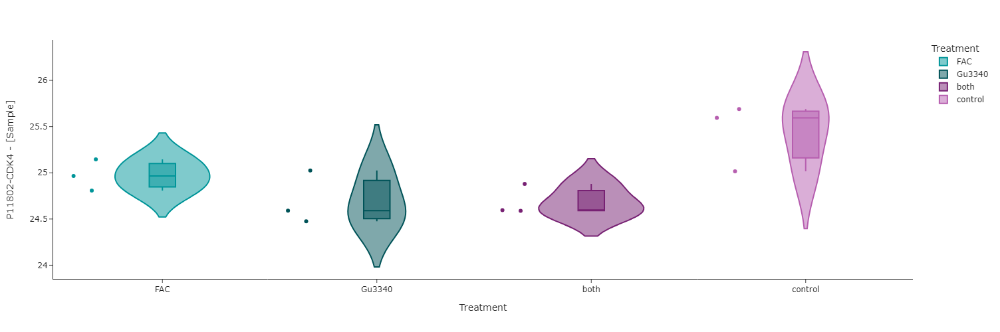

In [20]:
plot = df_total.plot_intensity(
    method="all",
    protein_id="P11802-CDK4", 
    group="Treatment", # column in metadata
    add_significance=True # add bar with pvalue
    )
plot.update_layout(plot_bgcolor="white", paper_bgcolor="white", height=500)

In [37]:
df_total.preprocess(imputation="knn") # required for dendrogram

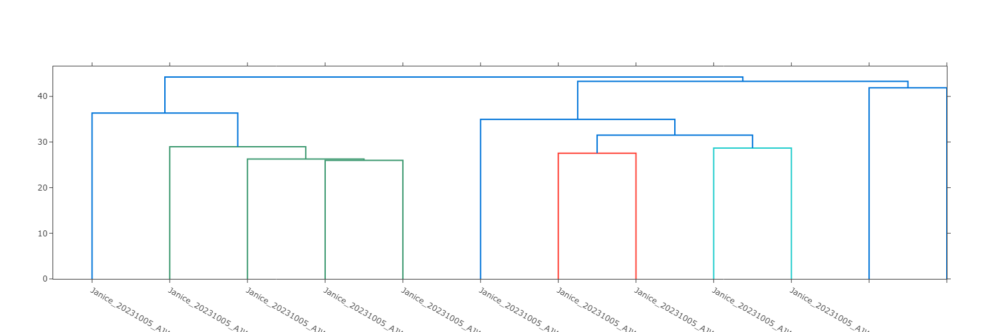

In [40]:
df_total.plot_dendrogram().update_layout(plot_bgcolor="white", paper_bgcolor="white", height=500) # need smaller sample labels for plot